In [1]:
import os
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T
#from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
from IPython.display import Audio, display, clear_output, HTML
import math
import numpy as np
import pandas as pd
from scipy import signal
#import seaborn as sns
import matplotlib.ticker as ticker
#sns.set(font_scale=1.2)
import pickle
import time
import shutil
from cepstrum import cepstrum
import glob
import re
import umap
import umap.plot
from pylab import rcParams
import cufflinks as cf
import hvplot
import hvplot.pandas
cf.set_config_file(sharing='public',theme='ggplot',offline=True)
import holoviews as hv
from holoviews import dim, opts
hv.extension('bokeh')
from scipy.integrate import simps
from numpy import pi as PI

In [2]:
class Station:
    
    def __init__(self, name, thrshold):
        self.name = name
        self.thrshold = thrshold
        self.events = []
        
    def set_event(self, event):
        if (event.duration >= self.thrshold):
            self.events.append(event)

class Event:
    
    def __init__(self, name, wav_dir, station):
        self.name = name
        self.station = station
        self.kind = '' # it will be the original wav file name
        self.duration = 0.0
        self.power = 0.0
        self.calculator(name, wav_dir)
    
    def calculator(self, audio, wav_dir):
        self.kind_set(audio)
        self.audio_average_power(wav_dir)
    
    def audio_average_power(self, wav_dir):
         
        main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/'
        #main = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/"

        wav_path = os.path.join(main + wav_dir, self.name)
        waveform, sample_rate = torchaudio.load(wav_path)
        num_channels, num_frames = waveform.shape
        
        if waveform.numpy().shape[1] != 0:
            
            ft_wf = np.fft.fft(waveform.numpy())/(math.sqrt(waveform.numpy().shape[1]))
            
            parseval_waveform = np.sum(waveform.numpy()**2)
            parseval_fourier_transform = np.sum(np.abs(ft_wf)**2)
            
            if (np.float32(round(parseval_waveform,1)) == np.float32(round(parseval_fourier_transform,1))):
                
                self.power = parseval_waveform
                
                duration = torch.arange(0, num_frames) / sample_rate
                self.duration = duration.numpy()[-1]
            
    def kind_set(self, audio):
        text = audio.split('_')
        self.kind = text[2]

def folders(wav_dir, station):
    
    noise = 'ruido/'
    not_noise = 'audios_all_classes/'
    wav_noise_names = os.listdir(wav_dir + noise)
    wav_not_noise_names = os.listdir(wav_dir + not_noise)
    
    print(station.name, " -> In Noise folder")
    
    for w in wav_noise_names:
        station.set_event(Event(w, wav_dir + noise, station.name))
    
    print(station.name, " -> In Not Noise folder")
    
    for nn in wav_not_noise_names:
        station.set_event(Event(nn, wav_dir + not_noise, station.name))
    
    return station

def dataframer(stations):
    
    thrshold = 0.5
    data = []
    framer = []
    
    for s in stations:
        
        data.clear()
        
        for e in s.events:
            
            if e.duration >= thrshold:
                data.append([s.name, e.name, e.kind, e.duration, e.power])
        
        framer.append(pd.DataFrame(data.copy(), columns = ['station', 'audio', 'class', 'duration', 'power']))
    
    return framer

#returns a slice of dataframes!!
def _initiator(thrshold):
    
    stations = []
    fls = []

#     main = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/"
#     wav_dir = '/home/kasparov/Documentos/20190114_vpoblete/20221019_Wasserstein/'
    
    fls.append("split_signals_into_labels_and_noise_20221020_for_ronda1/")
    fls.append("split_signals_into_labels_and_noise_20221022_for_ronda2/")
    fls.append("split_signals_into_labels_and_noise_20221020_for_ronda3/")
    fls.append("split_signals_into_labels_and_noise_20221020_for_ronda4/")
    fls.append("split_signals_into_labels_and_noise_20221020_for_ronda5/")
    fls.append("split_signals_into_labels_and_noise_20221022_for_ronda6/")
    
    
    for f in fls:
        stations.append(Station(f.split("_")[8], thrshold))
    
    for s in stations:
        
        for f in fls:
            if(f.split("_")[8] == s.name):
                print("Working in: ", s.name)
                s = folders(f, s)
                break
            
    return stations, fls

def _writer(stations):
    
    filewriter = open("stations/stations.fusa", "wb")
    stations = pickle.dump(stations, filewriter)
    filewriter.close()
    
def _npzwriter(stations):
    
    filewriter = open("stations/npz_stations.fusa", "wb")
    stations = pickle.dump(stations, filewriter)
    filewriter.close()
    
def _reader(file):
    
    filereader = open("stations/" + file, "rb")
    stations = pickle.load(filereader)
    filereader.close()
    
    return stations

def _copier(stations, fls):
    
    main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/'
    #main = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/"
    noise = 'ruido/'
    not_noise = 'audios_all_classes/'
    
    for s in stations:
        counter = 0
        l = len(s.events)
        
        for e in s.events:
            
            clear_output()
            print("In ", s.name, "  Files copied:  ",counter, "/", l)
            for f in fls:
                if(e.station == f.split("_")[8]):
                    counter = counter + 1

                    if("ruido" in e.name):
                        item = main+f+noise+e.name
                        shutil.copy(item, main+"stations/"+noise)
                        break
                    else:
                        item = main+f+not_noise+e.name
                        shutil.copy(item, main+"stations/"+not_noise)
                        break
                        
def _npz_copier(stations, fls):
    
    main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/'
    #main = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/"
    
    noise = 'ruido/'
    not_noise = 'audios_all_classes/'
    
    counter_noise = 0
    counter_event = 0
    for s in stations:
        counter = 0
        
        l = len(s.events)
        
        for e in s.events:
            
            clear_output()
            print("In ", s.name, "  Files copied:  ",counter, "/", l)
            for f in fls:
                if(e.station == f.split("_")[8]):
                    counter += 1
                    if("ruido" in e.name):
                        item = main+f+noise
                        filename = item+e.name
                        newit = main + "stations/" + noise
                        setattr(e, 'kind', e.name)
                        cep_filename = cepstrum(filename)
                        setattr(e, 'name', 'noise'+str(counter_noise)+'.npz')
                        newfile = newit + getattr(e, 'name')
                        np.savez(newfile, cep_filename)
                        counter_noise += 1
                    
                        break
                        
                    else:
                        item = main+f+not_noise
                        filename = item+e.name
                        newit = main + "stations/" + not_noise
                        setattr(e, 'kind', e.name)
                        cep_filename = cepstrum(filename)
                        setattr(e, 'name', 'event'+str(counter_event)+'.npz')
                        newfile = newit + getattr(e,'name')
                        np.savez(newfile, cep_filename)
                        counter_event += 1
                        break
            
    return stations


def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
     (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

def big_matrix():
    
#     npzfilespath =r"/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/stations/ruido/"  
    npzfilespath = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/"
    
    os.chdir(npzfilespath)
    npfiles= glob.glob("*.npz")
    npfiles.sort(key=natural_keys)
    all_arrays = []
    #print(npfiles)
    
    for i, npfile in enumerate(npfiles):
        #print(npfile)
        X = np.load(os.path.join(npzfilespath, npfile))
        #print(X)
        #print(len(X['arr_0']))
        all_arrays.append(X['arr_0'])
    
    big_matrix = np.array(all_arrays)
    np.savez('big_matrix_noise',big_matrix)
    print(big_matrix.shape)
    
def categorizer(row):
    
    if (row['station'] == 'ronda1/' or row['station'] == 'ronda2/'):
        
        return 'sensor_1' #'capta_002'
    
    elif (row['station'] == 'ronda3/' or row['station'] == 'ronda6/'):
        
        return 'sensor_2' #'capta'
    
    elif (row['station'] == 'ronda4/'):
        
        return 'sensor_3' #'control_acustico'
    
    elif (row['station'] == 'ronda5/'):
        
        return 'sensor_4' #'mma'
    
    print('falla')
    
def plot_waveform(waveform, sr, title="Waveform"):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    figure, axes = plt.subplots(num_channels, 1, figsize=(10,2))
    axes.plot(time_axis, waveform[0], linewidth=1, color='k')
    #axes.grid(True)
    figure.suptitle(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.show(block=False)
    
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None, ylim=True):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1, figsize=(10,2))
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate, cmap='Greys')
        axes[c].set_yscale('log')
        
    if num_channels > 1:
        axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
        axes[c].set_xlim(xlim)
    if ylim:
        #axes[c].set_ylim(ylim)
        axes[c].set_ylim([500, 10000])
    figure.suptitle(title)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Frequency (Hz)')
    plt.show(block=False)

In [ ]:
start = time.time()

stations, fls = _initiator(0.5)

end = time.time()

print(round(end-start,1))

_writer(stations)

In [ ]:
stations = _reader('stations.fusa')

In [3]:
fls=[]
fls.append("split_signals_into_labels_and_noise_20221020_for_ronda1/")
fls.append("split_signals_into_labels_and_noise_20221022_for_ronda2/")
fls.append("split_signals_into_labels_and_noise_20221020_for_ronda3/")
fls.append("split_signals_into_labels_and_noise_20221020_for_ronda4/")
fls.append("split_signals_into_labels_and_noise_20221020_for_ronda5/")
fls.append("split_signals_into_labels_and_noise_20221022_for_ronda6/")

In [ ]:
stations

In [ ]:
npz_station = _npz_copier(stations, fls)
_npzwriter(npz_station)

In [ ]:
df = dataframer(stations)

In [4]:
npz_stations = _reader('npz_stations.fusa')
df_npz = dataframer(npz_stations)
df_npz

[      station          audio  \
 0     ronda1/     noise0.npz   
 1     ronda1/     noise1.npz   
 2     ronda1/     noise2.npz   
 3     ronda1/     noise3.npz   
 4     ronda1/     noise4.npz   
 ...       ...            ...   
 1262  ronda1/  event1016.npz   
 1263  ronda1/  event1017.npz   
 1264  ronda1/  event1018.npz   
 1265  ronda1/  event1019.npz   
 1266  ronda1/  event1020.npz   
 
                                                  class   duration      power  
 0                  1653712794_1653712854_ruido_223.wav  13.647708   0.754834  
 1                  1653789034_1653789094_ruido_417.wav   2.769979   0.419892  
 2                  1653706209_1653706269_ruido_160.wav  27.045750   1.402200  
 3                 1655255968_1655256028_ruido_1248.wav   4.182500   0.074135  
 4                 1655063894_1655063954_ruido_1159.wav   1.474979   0.218602  
 ...                                                ...        ...        ...  
 1262  1655234087_1655234147_Camion_movimi

In [ ]:
big_matrix()

In [5]:
n_1 =50
m_1 =0.2

n_2 =40
m_2 =0.2

n_3 =30
m_3 =0.2

n_4 =40
m_4 =0.2

n_5 =50
m_5 =0.2

In [6]:
path_bm = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/stations/matrix/'
#path_bm = "Z:/Proyectos/AuMiLab/FUSA/Noise/fusa_power/stations/matrix/"
noises = np.load(path_bm + 'big_matrix_noise.npz')
X = noises['arr_0']
embedding = umap.UMAP(n_neighbors = 50,
                        min_dist  = 0.8,
                        verbose = True,
                        metric='correlation').fit(X)

emb_filename = "stations/embedding.fusa"

pickle.dump(embedding, open(emb_filename, "wb"))

UMAP(angular_rp_forest=True, metric='correlation', min_dist=0.8, n_neighbors=50, verbose=True)
Tue Nov 22 04:12:34 2022 Construct fuzzy simplicial set
Tue Nov 22 04:13:25 2022 Finding Nearest Neighbors
Tue Nov 22 04:13:26 2022 Finished Nearest Neighbor Search
Tue Nov 22 04:13:28 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Nov 22 04:13:35 2022 Finished embedding


In [7]:
embedding = pickle.load(open(emb_filename, "rb"))

In [8]:
frame = [df_npz[0], df_npz[1], df_npz[2], df_npz[3], df_npz[4], df_npz[5]]
df = pd.concat(frame)
df['station_name'] = df.apply(lambda row: categorizer(row), axis=1)
df.sort_values(by=['audio'])
df

,station,audio,class,duration,power,station_name
0,ronda1/,noise0.npz,1653712794_1653712854_ruido_223.wav,13.647708,0.754834,sensor_1
1,ronda1/,noise1.npz,1653789034_1653789094_ruido_417.wav,2.769979,0.419892,sensor_1
2,ronda1/,noise2.npz,1653706209_1653706269_ruido_160.wav,27.045750,1.402200,sensor_1
3,ronda1/,noise3.npz,1655255968_1655256028_ruido_1248.wav,4.182500,0.074135,sensor_1
4,ronda1/,noise4.npz,1655063894_1655063954_ruido_1159.wav,1.474979,0.218602,sensor_1
...,...,...,...,...,...,...
1998,ronda6/,event7674.npz,62e39b767a2acbde063ecf57_Multitud_1166.wav,10.960229,153.902313,sensor_2
1999,ronda6/,event7675.npz,62e4c87f7a2acbde063ed7a9_Camion_movimiento_202...,11.274271,101.971397,sensor_2
2000,ronda6/,event7676.npz,62e3d6127a2acbde063ed23a_Camion_1479.wav,29.999979,494.117554,sensor_2
2001,ronda6/,event7677.npz,62e23bd47a2acbde063eca5b_Automovil_movimiento_...,18.013229,24.495485,sensor_2


In [9]:
data = df[df['audio'].str.contains('noise')]
data

,station,audio,class,duration,power,station_name
0,ronda1/,noise0.npz,1653712794_1653712854_ruido_223.wav,13.647708,0.754834,sensor_1
1,ronda1/,noise1.npz,1653789034_1653789094_ruido_417.wav,2.769979,0.419892,sensor_1
2,ronda1/,noise2.npz,1653706209_1653706269_ruido_160.wav,27.045750,1.402200,sensor_1
3,ronda1/,noise3.npz,1655255968_1655256028_ruido_1248.wav,4.182500,0.074135,sensor_1
4,ronda1/,noise4.npz,1655063894_1655063954_ruido_1159.wav,1.474979,0.218602,sensor_1
...,...,...,...,...,...,...
192,ronda6/,noise1789.npz,62e4bf687a2acbde063ed68c_ruido_1965.wav,12.370438,0.873634,sensor_2
193,ronda6/,noise1790.npz,62e3673c7a2acbde063ecb48_ruido_724.wav,0.794667,0.466743,sensor_2
194,ronda6/,noise1791.npz,62e2175c7a2acbde063ec764_ruido_321.wav,0.582500,0.029089,sensor_2
195,ronda6/,noise1792.npz,62e4b7147a2acbde063ed579_ruido_1864.wav,9.151271,1.930381,sensor_2


In [10]:
embedding

UMAP(angular_rp_forest=True, metric='correlation', min_dist=0.8, n_neighbors=50, verbose=True)

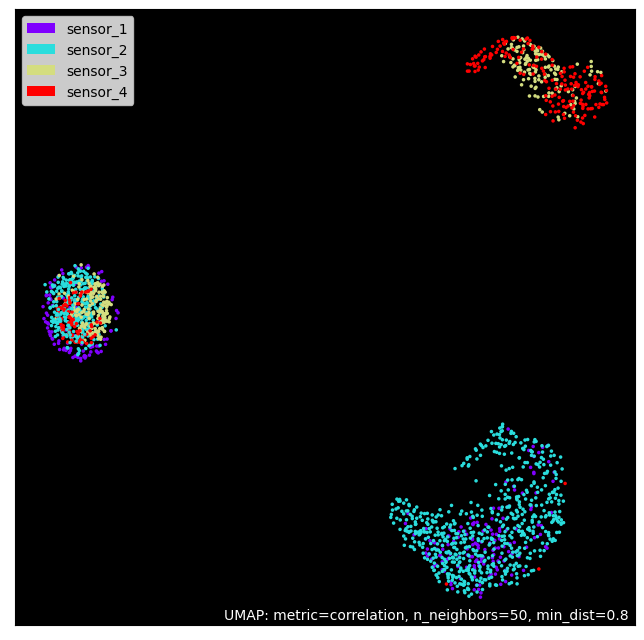

In [11]:
umap.plot.points(embedding, labels = data.station_name,theme='fire')
umap.plot.plt.show()

In [12]:
data["Embedding 0"] = embedding.embedding_[:, 0]
data["Embedding 1"] = embedding.embedding_[:, 1]

<AxesSubplot:xlabel='Embedding 0', ylabel='Embedding 1'>

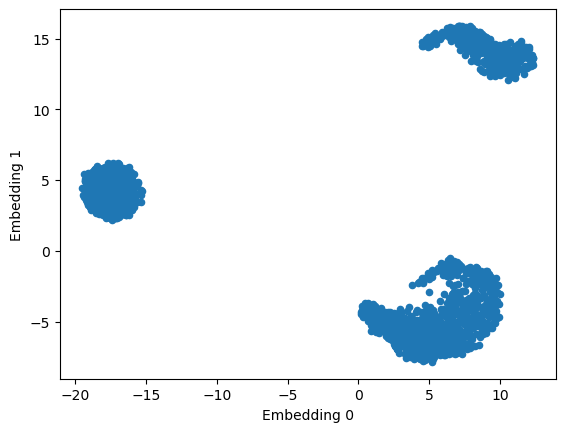

In [13]:
data.plot.scatter(x = "Embedding 0", y = "Embedding 1")

In [14]:
data.hvplot(kind='scatter', x = 'Embedding 0', y = 'Embedding 1', by = 'station_name')

:NdOverlay   [station_name]
   :Scatter   [Embedding 0]   (Embedding 1)

In [15]:
miniball = data[data['Embedding 0'] < -5]

miniball.to_csv('stations/UMAP_df_separation/miniball.csv') # checkpoints para no tener que correr todo

miniball

,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
4,ronda1/,noise4.npz,1655063894_1655063954_ruido_1159.wav,1.474979,0.218602,sensor_1,-17.705572,5.417709
10,ronda1/,noise10.npz,1653787701_1653787761_ruido_366.wav,0.869979,0.041000,sensor_1,-19.071760,5.291894
11,ronda1/,noise11.npz,1653981393_16539814531_ruido_578.wav,0.969521,0.030351,sensor_1,-18.605259,3.010363
12,ronda1/,noise12.npz,1653981393_16539814531_ruido_574.wav,1.258250,0.022924,sensor_1,-19.500759,4.463834
14,ronda1/,noise14.npz,1654238167_16542382271_ruido_724.wav,1.349979,0.069800,sensor_1,-19.076836,3.231938
...,...,...,...,...,...,...,...,...
181,ronda6/,noise1778.npz,62df75947a2acbde063ebe2e_ruido_306.wav,0.562292,0.280692,sensor_2,-18.687338,3.749296
187,ronda6/,noise1784.npz,62e380727a2acbde063ecd51_ruido_939.wav,0.755667,13.400764,sensor_2,-19.014454,4.007041
191,ronda6/,noise1788.npz,62e21bc17a2acbde063ec7be_ruido_369.wav,0.528938,0.121111,sensor_2,-17.973038,2.940909
193,ronda6/,noise1790.npz,62e3673c7a2acbde063ecb48_ruido_724.wav,0.794667,0.466743,sensor_2,-18.328152,3.278404


In [20]:
upper = data[data['Embedding 0'] > -5]
upper = upper[upper['Embedding 1'] > 10]

upper.to_csv('stations/UMAP_df_separation/upper.csv')

upper

,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
5,ronda4/,noise1019.npz,EM2030-00749-2022-06-02T09-57-00-070dB_ruido_7...,2.330083,1.327942,sensor_3,11.498003,14.445656
7,ronda4/,noise1021.npz,EM2030-00750-2022-06-04T16-50-55-063dB_ruido_8...,3.565104,0.141079,sensor_3,8.622331,15.174357
8,ronda4/,noise1022.npz,EM2030-00750-2022-05-31T15-43-21-067dB_ruido_7...,3.874156,0.765521,sensor_3,8.323772,14.413033
17,ronda4/,noise1031.npz,EM2030-00749-2022-07-03T21-45-39-057dB_ruido_6...,2.760042,0.091752,sensor_3,8.444717,15.306428
19,ronda4/,noise1033.npz,EM2030-00749-2022-07-03T05-40-44-072dB_ruido_6...,2.482646,0.045760,sensor_3,8.414619,15.403194
22,ronda4/,noise1036.npz,EM2030-00750-2022-06-16T14-22-35-057dB_ruido_1...,1.786896,0.116190,sensor_3,9.094237,14.662416
23,ronda4/,noise1037.npz,EM2030-00750-2022-06-02T16-11-17-064dB_ruido_7...,1.984552,1.465698,sensor_3,10.422129,13.424067
26,ronda4/,noise1040.npz,EM2030-00749-2022-06-13T14-15-23-068dB_ruido_2...,4.516125,2.213531,sensor_3,9.054948,14.259442
27,ronda4/,noise1041.npz,EM2030-00750-2022-06-13T13-59-18-067dB_ruido_1...,2.593802,0.242569,sensor_3,6.776728,15.389034
28,ronda4/,noise1042.npz,EM2030-00750-2022-07-05T15-00-35-058dB_ruido_1...,2.127875,0.155631,sensor_3,9.614729,14.621488


In [232]:
lower = data[data['Embedding 0'] > -5]
lower = lower[lower['Embedding 1'] < 10]

lower.to_csv('stations/UMAP_df_separation/lower.csv')


lower

,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,ronda1/,noise0.npz,1653712794_1653712854_ruido_223.wav,13.647708,0.754834,sensor_1,5.088675,-5.663317
1,ronda1/,noise1.npz,1653789034_1653789094_ruido_417.wav,2.769979,0.419892,sensor_1,2.457941,-6.244883
2,ronda1/,noise2.npz,1653706209_1653706269_ruido_160.wav,27.045750,1.402200,sensor_1,6.265330,-4.083441
3,ronda1/,noise3.npz,1655255968_1655256028_ruido_1248.wav,4.182500,0.074135,sensor_1,3.501771,-4.966332
5,ronda1/,noise5.npz,1654220421_1654220481_ruido_709.wav,6.749979,0.995816,sensor_1,3.562532,-7.200064
6,ronda1/,noise6.npz,1653792853_1653792913_ruido_457.wav,1.599979,0.161079,sensor_1,4.759497,-6.137796
7,ronda1/,noise7.npz,1653709302_1653709362_ruido_185.wav,2.662937,0.079253,sensor_1,4.856501,-4.699537
8,ronda1/,noise8.npz,1653709302_1653709362_ruido_193.wav,1.830771,0.050816,sensor_1,5.949594,-4.081227
9,ronda1/,noise9.npz,1654985740_1654985800_ruido_1029.wav,5.799979,2.116780,sensor_1,9.221925,-4.264986
13,ronda1/,noise13.npz,1653709302_1653709362_ruido_187.wav,3.079042,0.087355,sensor_1,4.801611,-4.773548


In [ ]:
pd.set_option('display.max_rows', None)
station_audio_to_listen = miniball['station']
station_audio_to_listen

In [ ]:
miniball

In [16]:
data_miniball = miniball.reset_index()
data_miniball

,index,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,4,ronda1/,noise4.npz,1655063894_1655063954_ruido_1159.wav,1.474979,0.218602,sensor_1,-17.705572,5.417709
1,10,ronda1/,noise10.npz,1653787701_1653787761_ruido_366.wav,0.869979,0.041000,sensor_1,-19.071760,5.291894
2,11,ronda1/,noise11.npz,1653981393_16539814531_ruido_578.wav,0.969521,0.030351,sensor_1,-18.605259,3.010363
3,12,ronda1/,noise12.npz,1653981393_16539814531_ruido_574.wav,1.258250,0.022924,sensor_1,-19.500759,4.463834
4,14,ronda1/,noise14.npz,1654238167_16542382271_ruido_724.wav,1.349979,0.069800,sensor_1,-19.076836,3.231938
...,...,...,...,...,...,...,...,...,...
694,181,ronda6/,noise1778.npz,62df75947a2acbde063ebe2e_ruido_306.wav,0.562292,0.280692,sensor_2,-18.687338,3.749296
695,187,ronda6/,noise1784.npz,62e380727a2acbde063ecd51_ruido_939.wav,0.755667,13.400764,sensor_2,-19.014454,4.007041
696,191,ronda6/,noise1788.npz,62e21bc17a2acbde063ec7be_ruido_369.wav,0.528938,0.121111,sensor_2,-17.973038,2.940909
697,193,ronda6/,noise1790.npz,62e3673c7a2acbde063ecb48_ruido_724.wav,0.794667,0.466743,sensor_2,-18.328152,3.278404


In [165]:
data_miniball['station'].loc[0]

'ronda1/'

In [17]:
pd.set_option('display.max_rows', None)
audio_listen_to = miniball['class']
audio_listen_to.reset_index()
audio_listen_to

4                   1655063894_1655063954_ruido_1159.wav
10                   1653787701_1653787761_ruido_366.wav
11                  1653981393_16539814531_ruido_578.wav
12                  1653981393_16539814531_ruido_574.wav
14                  1654238167_16542382271_ruido_724.wav
15                  1655030626_1655030686_ruido_1088.wav
22                  1655030626_1655030686_ruido_1092.wav
23                  1654238167_16542382271_ruido_742.wav
24                   1653787701_1653787761_ruido_376.wav
25                  1655234087_1655234147_ruido_1200.wav
29                  1653981393_16539814531_ruido_586.wav
30                  1654238167_16542382271_ruido_728.wav
32                   1653872481_1653872541_ruido_526.wav
35                  1654270595_16542706551_ruido_846.wav
41                   1654909819_1654909879_ruido_991.wav
44                  1654270110_16542701701_ruido_813.wav
49                   1654271021_1654271081_ruido_905.wav
52                  1653981393_

In [ ]:
station_audio_to_listen.loc[10].iat[0]

In [167]:
data_miniball

,index,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,4,ronda1/,noise4.npz,1655063894_1655063954_ruido_1159.wav,1.474979,0.218602,sensor_1,-17.705572,5.417709
1,10,ronda1/,noise10.npz,1653787701_1653787761_ruido_366.wav,0.869979,0.041000,sensor_1,-19.071760,5.291894
2,11,ronda1/,noise11.npz,1653981393_16539814531_ruido_578.wav,0.969521,0.030351,sensor_1,-18.605259,3.010363
3,12,ronda1/,noise12.npz,1653981393_16539814531_ruido_574.wav,1.258250,0.022924,sensor_1,-19.500759,4.463834
4,14,ronda1/,noise14.npz,1654238167_16542382271_ruido_724.wav,1.349979,0.069800,sensor_1,-19.076836,3.231938
5,15,ronda1/,noise15.npz,1655030626_1655030686_ruido_1088.wav,0.559958,0.038051,sensor_1,-19.305964,4.962263
6,22,ronda1/,noise22.npz,1655030626_1655030686_ruido_1092.wav,0.846625,0.181172,sensor_1,-19.318182,4.926443
7,23,ronda1/,noise23.npz,1654238167_16542382271_ruido_742.wav,1.094958,0.053150,sensor_1,-19.100723,5.474579
8,24,ronda1/,noise24.npz,1653787701_1653787761_ruido_376.wav,0.639979,0.016448,sensor_1,-19.353977,3.819145
9,25,ronda1/,noise25.npz,1655234087_1655234147_ruido_1200.wav,0.874146,0.196036,sensor_1,-18.986544,3.113195


In [169]:
data_miniball.loc[0]

index                                              4
station                                      ronda1/
audio                                     noise4.npz
class           1655063894_1655063954_ruido_1159.wav
duration                                    1.474979
power                                       0.218602
station_name                                sensor_1
Embedding 0                               -17.705572
Embedding 1                                 5.417709
Name: 0, dtype: object

In [166]:
data_miniball.loc[1].iat[3]

'1653787701_1653787761_ruido_366.wav'

In [ ]:
a = 15
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_miniball['station'].loc[a] + 'ruido/'
wav_file = main + data_miniball.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

In [21]:
data_upper = upper.reset_index()
data_upper 

,index,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,5,ronda4/,noise1019.npz,EM2030-00749-2022-06-02T09-57-00-070dB_ruido_7...,2.330083,1.327942,sensor_3,11.498003,14.445656
1,7,ronda4/,noise1021.npz,EM2030-00750-2022-06-04T16-50-55-063dB_ruido_8...,3.565104,0.141079,sensor_3,8.622331,15.174357
2,8,ronda4/,noise1022.npz,EM2030-00750-2022-05-31T15-43-21-067dB_ruido_7...,3.874156,0.765521,sensor_3,8.323772,14.413033
3,17,ronda4/,noise1031.npz,EM2030-00749-2022-07-03T21-45-39-057dB_ruido_6...,2.760042,0.091752,sensor_3,8.444717,15.306428
4,19,ronda4/,noise1033.npz,EM2030-00749-2022-07-03T05-40-44-072dB_ruido_6...,2.482646,0.045760,sensor_3,8.414619,15.403194
5,22,ronda4/,noise1036.npz,EM2030-00750-2022-06-16T14-22-35-057dB_ruido_1...,1.786896,0.116190,sensor_3,9.094237,14.662416
6,23,ronda4/,noise1037.npz,EM2030-00750-2022-06-02T16-11-17-064dB_ruido_7...,1.984552,1.465698,sensor_3,10.422129,13.424067
7,26,ronda4/,noise1040.npz,EM2030-00749-2022-06-13T14-15-23-068dB_ruido_2...,4.516125,2.213531,sensor_3,9.054948,14.259442
8,27,ronda4/,noise1041.npz,EM2030-00750-2022-06-13T13-59-18-067dB_ruido_1...,2.593802,0.242569,sensor_3,6.776728,15.389034
9,28,ronda4/,noise1042.npz,EM2030-00750-2022-07-05T15-00-35-058dB_ruido_1...,2.127875,0.155631,sensor_3,9.614729,14.621488


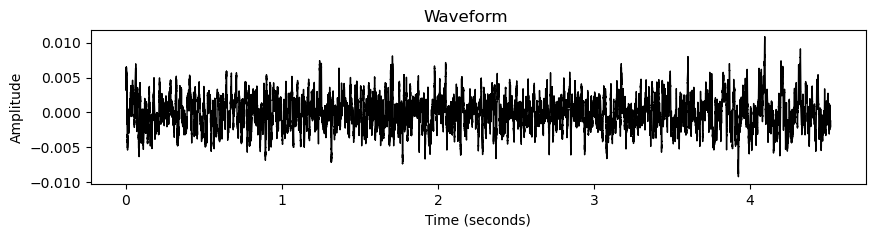

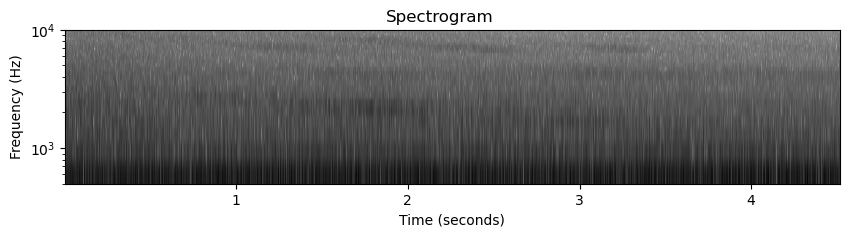

In [30]:
a = 7
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_upper['station'].loc[a] + 'ruido/'
wav_file = main + data_upper.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

In [31]:
resample_rate = 32000
resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)

In [34]:
waveform_ex = resampled_waveform.numpy()
waveform_ex[0]

array([ 0.00267725,  0.00430133,  0.00380105, ..., -0.00123799,
       -0.00131634, -0.00079269], dtype=float32)

In [35]:
# Fourier transform

FourierCoeff = np.fft.fft(waveform_ex[0])/waveform_ex[0].size
DC = [np.abs(FourierCoeff[0])]
amp = np.concatenate((DC, 2*np.abs(FourierCoeff[1:])))  

# compute frequencies vector until half the sampling rate

Nsamples = int( math.floor(waveform_ex[0].size/2) )
hz = np.linspace(0, resample_rate/2., num = Nsamples + 1 )
dhz = hz[1]

print('Spectral resolution = %2.4f Hz'%dhz)

Spectral resolution = 0.2214 Hz


In [36]:
# Perform Welch's periodogram
segment = int( resample_rate*0.5 ) 
myhann = signal.get_window('hann', segment)

# obtain simply Power (amplitude^2) withouth tappering
myparams = dict(fs = resample_rate, nperseg = segment, window = np.ones(segment), 
                noverlap = 0, scaling = 'spectrum', return_onesided=True)
freq, ps = signal.welch(x = waveform_ex[0], **myparams)# units uV**2
ps = 2*ps # correct for negative frequencies

#obtain Power density (amplitude^2/Hz) withouth tappering
myparams = dict(fs = resample_rate, nperseg = segment, window = np.ones(segment), 
                noverlap = 0, scaling = 'density', return_onesided=True)
freq, psd = signal.welch(x = waveform_ex[0], **myparams)# units uV**2/Hz
psd = 2*psd # correct for negative frequencies

dfreq = freq[1]
print('Spectral resolution = %2.4f Hz'%dfreq)

Spectral resolution = 2.0000 Hz


Text(0.5, 0, 'Frequency (Hz)')

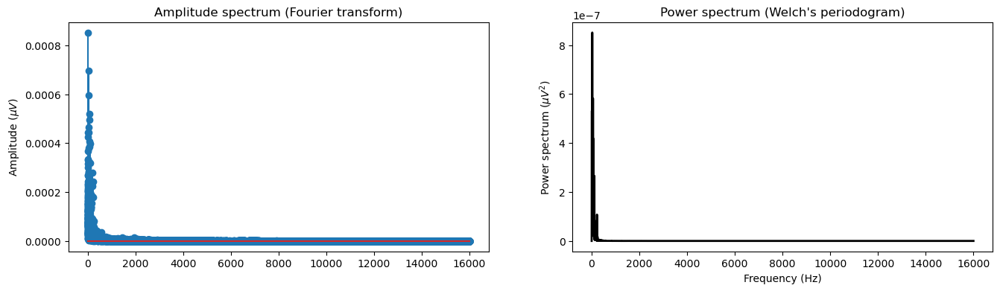

In [38]:
# Plot the power spectrum

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].set_title("Amplitude spectrum (Fourier transform)")
ax[0].stem(hz,amp[:len(hz)], use_line_collection = True)
ax[0].set_ylabel('Amplitude ($\mu V$)')

ax[1].set_title("Power spectrum (Welch's periodogram)")
#ax[1].semilogx(freq, ps, color='k', lw=2) 
ax[1].plot(freq, ps, color='k', lw=2) 
ax[1].set_ylabel('Power spectrum ($\mu V^2$)')
ax[1].set_xlabel('Frequency (Hz)')

In [44]:
# Sine wave has an amplitude of 2 uV, the power is 4 uV and the power density is 4*4 because
# we took a segment with size = 4x the sampling rate
print('Signal amplitude     = %.30f uVolts'%amp[int(1.5/dhz)]) 
print('Signal power         = %.30f uVolts^2'%ps[int(1.5/dfreq)])
print('Singal power density = %.30f uVolts^2/Hz'%psd[int(1.5/dfreq)])

Signal amplitude     = 0.000095235543047254739052083494 uVolts
Signal power         = 0.000000000000000000000600371919 uVolts^2
Singal power density = 0.000000000000000000000300185960 uVolts^2/Hz


In [45]:
# Perform Welch's periodogram with hann window and 50% overlap
segment = int( 0.5*resample_rate ) 
myhann = signal.get_window('hann', segment)


# obtain simply Power (uV^2) with Hann window and 50% overlap
myparams = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                noverlap = segment/2, scaling = 'spectrum', return_onesided=True)

freq, ps = signal.welch(x = waveform_ex[0], **myparams)# units uV**2
ps = 2*ps # correct for negative frequencies

# obtain Power density (uV^2/Hz) with Hann window and 50% overlap
# to get back to simply power, divide by the segment lenght in seconds (four in our case)
myparams2 = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                 noverlap = segment/2, scaling = 'density', return_onesided=True)
freq, psd = signal.welch(x = waveform_ex[0], **myparams2)# units uV**2
psd = 2*psd

dfreq = freq[1]
print('Spectral resolution = %2.4f Hz'%dfreq)

Spectral resolution = 2.0000 Hz


Text(0, 0.5, 'Power spectrum density \n($\\mu V^2/Hz$)')

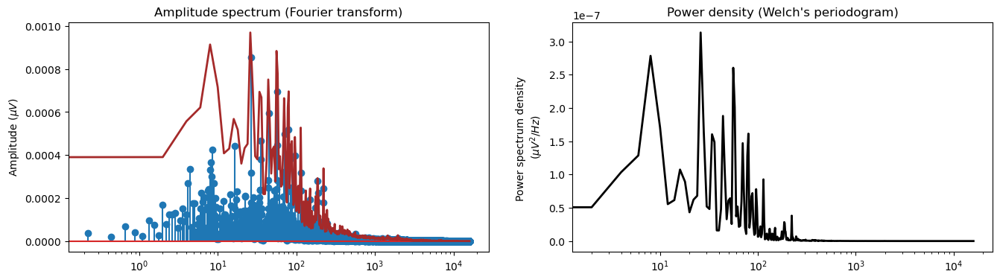

In [67]:
# Plot the power spectrum

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].set_title("Amplitude spectrum (Fourier transform)")
ax[0].stem(hz,amp[:len(hz)], use_line_collection = True)
ax[0].semilogx(freq, np.sqrt(ps), color='brown', lw = 2)
ax[0].set_ylabel('Amplitude ($\mu V$)')

ax[1].set_title("Power density (Welch's periodogram)")
ax[1].semilogx(freq, psd, color='k', lw=2)

ax[1].set_ylabel('Power spectrum density \n($\mu V^2/Hz$)')

In [51]:
psd[0]

9.209812e-09

In [52]:
normalized_psd = psd / np.linalg.norm(psd)
normalized_psd_dB = 10*np.log10(normalized_psd)

/tmp/ipykernel_16551/1402986609.py:9: UserWarning:

Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.



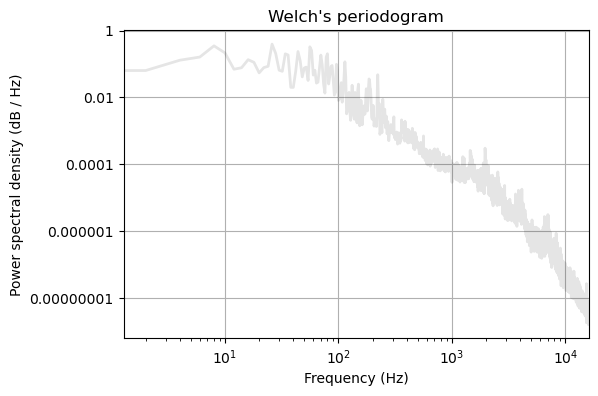

In [68]:
plt.figure(figsize=(6,4))
#plt.plot(freqs, psd[0], color='k', lw=2)
plt.loglog(freq, normalized_psd, color='k', lw=2, alpha=0.1)
plt.xlabel('Frequency (Hz)')
#plt.ylabel('Power spectral density (V^2 / Hz)')
plt.ylabel('Power spectral density (dB / Hz)')
#plt.ylim([0, psd.max() * 1.1])
plt.title("Welch's periodogram")
plt.xlim([0, freq.max()])
plt.grid(True)
ax=plt.gca()
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))
plt.show(block=False)

In [70]:
# compute delta-band
idx_delta = np.logical_and(freq >= 600, freq <=1500)
band_power = simps(psd[idx_delta], dx = dfreq)
total_power = simps(psd, dx = dfreq)

print('Absolute power: %.15f uV^2' % band_power)
print('Relative power: %.15f ' % (band_power/total_power))

Absolute power: 0.000000068015557 uV^2
Relative power: 0.006772389226612 


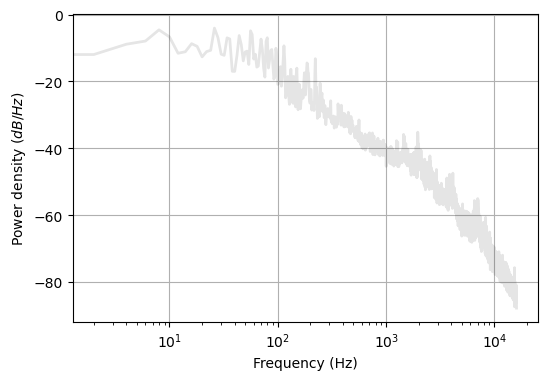

In [85]:
# plot in logaritmic scale
plt.figure(figsize=(6,4))
plt.semilogx(freq, normalized_psd_dB, color='k', lw=2, alpha=0.1)
plt.xlabel('Frequency (Hz)'), plt.ylabel('Power density ($dB/Hz)$')
#plt.xlim(0,40), plt.ylim(0.1,1000)
ax=plt.gca()
plt.grid(True)
plt.show(block=False)

In [199]:
# Perform Welch's periodogram with hann window and 50% overlap
def welch_periodogram(wav_file):
    
    waveform, sample_rate = torchaudio.load(wav_file)
    resample_rate = 32000
    resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
    resampled_waveform = resampler(waveform)
    
    segment = int( 0.5*resample_rate ) 
    myhann = signal.get_window('hann', segment)


    # obtain simply Power (uV^2) with Hann window and 50% overlap
    myparams = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                noverlap = segment/2, scaling = 'spectrum', return_onesided=True)

    freq, ps = signal.welch(x = resampled_waveform, **myparams)# units uV**2
    ps = 2*ps # correct for negative frequencies

    # obtain Power density (uV^2/Hz) with Hann window and 50% overlap
    # to get back to simply power, divide by the segment lenght in seconds (four in our case)
    myparams2 = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                 noverlap = segment/2, scaling = 'density', return_onesided=True)
    freq, psd = signal.welch(x = resampled_waveform, **myparams2)# units uV**2
    psd = 2*psd

    dfreq = freq[1]
    #print('Spectral resolution = %2.4f Hz'%dfreq)
    
    normalized_psd = psd / np.linalg.norm(psd)
    normalized_psd_dB = 10*np.log10(normalized_psd)
    
    # plot in logaritmic scale
    ##plt.figure(figsize=(6,4))
    
    ##plt.semilogx(freq, normalized_psd_dB.T, color='k', lw=2, alpha=0.1)
    ##plt.xlabel('Frequency (Hz)'), plt.ylabel('Power density ($dB/Hz)$')
    ##ax=plt.gca()
    ##plt.grid(True)
    ##plt.show(block=False)
    
    #fig=plt.figure()
    #fig.show()
    #ax=fig.add_subplot(111)
    
    #ax.semilogx(freq, normalized_psd_dB.T, color='k', lw=2, alpha=0.1)
    
    return freq, normalized_psd_dB

In [170]:
data_upper

,index,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,5,ronda4/,noise1019.npz,EM2030-00749-2022-06-02T09-57-00-070dB_ruido_7...,2.330083,1.327942,sensor_3,11.498003,14.445656
1,7,ronda4/,noise1021.npz,EM2030-00750-2022-06-04T16-50-55-063dB_ruido_8...,3.565104,0.141079,sensor_3,8.622331,15.174357
2,8,ronda4/,noise1022.npz,EM2030-00750-2022-05-31T15-43-21-067dB_ruido_7...,3.874156,0.765521,sensor_3,8.323772,14.413033
3,17,ronda4/,noise1031.npz,EM2030-00749-2022-07-03T21-45-39-057dB_ruido_6...,2.760042,0.091752,sensor_3,8.444717,15.306428
4,19,ronda4/,noise1033.npz,EM2030-00749-2022-07-03T05-40-44-072dB_ruido_6...,2.482646,0.045760,sensor_3,8.414619,15.403194
5,22,ronda4/,noise1036.npz,EM2030-00750-2022-06-16T14-22-35-057dB_ruido_1...,1.786896,0.116190,sensor_3,9.094237,14.662416
6,23,ronda4/,noise1037.npz,EM2030-00750-2022-06-02T16-11-17-064dB_ruido_7...,1.984552,1.465698,sensor_3,10.422129,13.424067
7,26,ronda4/,noise1040.npz,EM2030-00749-2022-06-13T14-15-23-068dB_ruido_2...,4.516125,2.213531,sensor_3,9.054948,14.259442
8,27,ronda4/,noise1041.npz,EM2030-00750-2022-06-13T13-59-18-067dB_ruido_1...,2.593802,0.242569,sensor_3,6.776728,15.389034
9,28,ronda4/,noise1042.npz,EM2030-00750-2022-07-05T15-00-35-058dB_ruido_1...,2.127875,0.155631,sensor_3,9.614729,14.621488


In [172]:
data_upper.loc[0].iat[3]

'EM2030-00749-2022-06-02T09-57-00-070dB_ruido_75.wav'

In [162]:
#main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_upper['station'].loc[a] + 'ruido/'

data_upper['station'].loc[135]

'ronda5/'

In [146]:
data_upper_r4 = data_upper[data_upper['station'].str.contains('ronda4')]
print(len(data_upper_r4))

135


In [150]:
data_upper_r4

,index,station,audio,class,duration,power,station_name,Embedding 0,Embedding 1
0,5,ronda4/,noise1019.npz,EM2030-00749-2022-06-02T09-57-00-070dB_ruido_7...,2.330083,1.327942,sensor_3,11.498003,14.445656
1,7,ronda4/,noise1021.npz,EM2030-00750-2022-06-04T16-50-55-063dB_ruido_8...,3.565104,0.141079,sensor_3,8.622331,15.174357
2,8,ronda4/,noise1022.npz,EM2030-00750-2022-05-31T15-43-21-067dB_ruido_7...,3.874156,0.765521,sensor_3,8.323772,14.413033
3,17,ronda4/,noise1031.npz,EM2030-00749-2022-07-03T21-45-39-057dB_ruido_6...,2.760042,0.091752,sensor_3,8.444717,15.306428
4,19,ronda4/,noise1033.npz,EM2030-00749-2022-07-03T05-40-44-072dB_ruido_6...,2.482646,0.045760,sensor_3,8.414619,15.403194
5,22,ronda4/,noise1036.npz,EM2030-00750-2022-06-16T14-22-35-057dB_ruido_1...,1.786896,0.116190,sensor_3,9.094237,14.662416
6,23,ronda4/,noise1037.npz,EM2030-00750-2022-06-02T16-11-17-064dB_ruido_7...,1.984552,1.465698,sensor_3,10.422129,13.424067
7,26,ronda4/,noise1040.npz,EM2030-00749-2022-06-13T14-15-23-068dB_ruido_2...,4.516125,2.213531,sensor_3,9.054948,14.259442
8,27,ronda4/,noise1041.npz,EM2030-00750-2022-06-13T13-59-18-067dB_ruido_1...,2.593802,0.242569,sensor_3,6.776728,15.389034
9,28,ronda4/,noise1042.npz,EM2030-00750-2022-07-05T15-00-35-058dB_ruido_1...,2.127875,0.155631,sensor_3,9.614729,14.621488


In [148]:
data_upper_r5 = data_upper[data_upper['station'].str.contains('ronda5')]
print(len(data_upper_r5))

180


In [149]:
print(len(data_upper['class']))

315


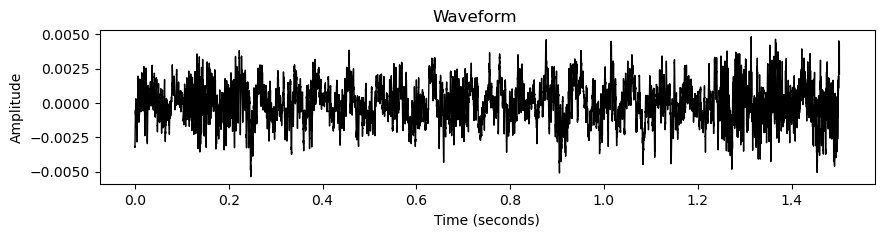

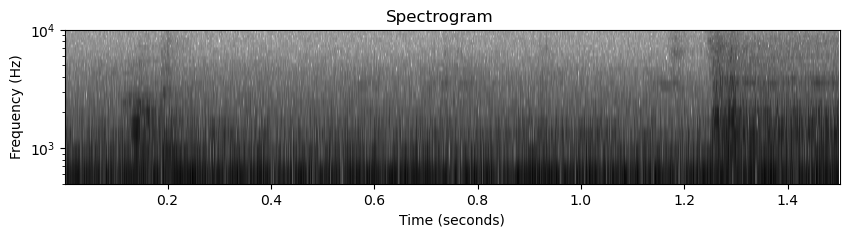

In [61]:
a = 10
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_upper['station'].loc[a] + 'ruido/'
wav_file = main + data_upper.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

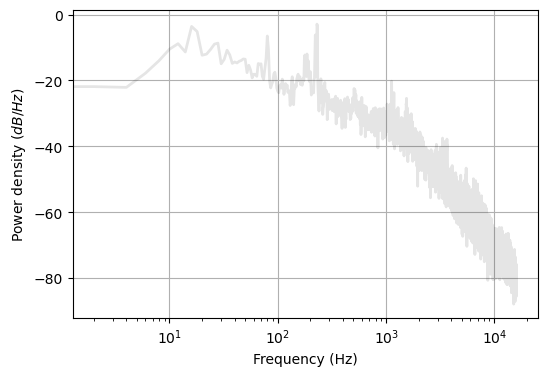

In [105]:
output_welch = welch_periodogram(waveform, sample_rate)


In [110]:
data_upper['class'][0]

'EM2030-00749-2022-06-02T09-57-00-070dB_ruido_75.wav'

In [130]:
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_upper['station'] + 'ruido/'
main

0      /home/kasparov/Documentos/20190114_vpoblete/20...
1      /home/kasparov/Documentos/20190114_vpoblete/20...
2      /home/kasparov/Documentos/20190114_vpoblete/20...
3      /home/kasparov/Documentos/20190114_vpoblete/20...
4      /home/kasparov/Documentos/20190114_vpoblete/20...
5      /home/kasparov/Documentos/20190114_vpoblete/20...
6      /home/kasparov/Documentos/20190114_vpoblete/20...
7      /home/kasparov/Documentos/20190114_vpoblete/20...
8      /home/kasparov/Documentos/20190114_vpoblete/20...
9      /home/kasparov/Documentos/20190114_vpoblete/20...
10     /home/kasparov/Documentos/20190114_vpoblete/20...
11     /home/kasparov/Documentos/20190114_vpoblete/20...
12     /home/kasparov/Documentos/20190114_vpoblete/20...
13     /home/kasparov/Documentos/20190114_vpoblete/20...
14     /home/kasparov/Documentos/20190114_vpoblete/20...
15     /home/kasparov/Documentos/20190114_vpoblete/20...
16     /home/kasparov/Documentos/20190114_vpoblete/20...
17     /home/kasparov/Documento

In [180]:
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/'

print(main + data_upper['station'].loc[134] + 'ruido/' + data_upper.loc[0].iat[3])

/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/ronda4/ruido/EM2030-00749-2022-06-02T09-57-00-070dB_ruido_75.wav


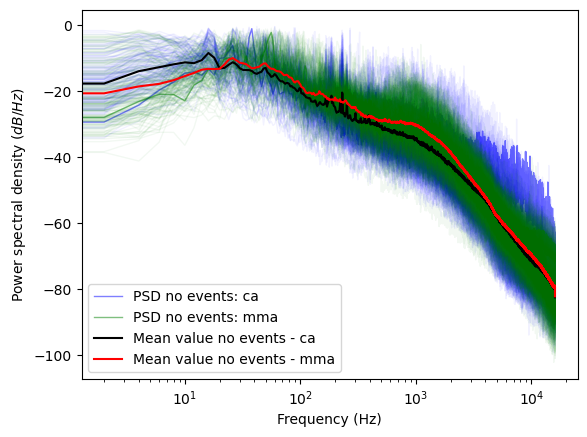

In [260]:
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' 

fig = plt.figure()
mean_value_mma = []
mean_value_ca = []

for f in range(len(data_upper['class'])):
    
    if (data_upper['station'].loc[f]=='ronda4/'):
        
        wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
        freq, normalized_psd_dB = welch_periodogram(wav_file)
        mean_value_ca.append(normalized_psd_dB)
        #fig.add_subplot(111)
        plt.semilogx(freq, normalized_psd_dB.T, color='b', lw=1, alpha=0.05)
        
        if f == 0:
            plt.semilogx(freq, normalized_psd_dB.T, color='b', lw=1, alpha=0.5, label='PSD no events: ca')
        
    if (data_upper['station'].loc[f]=='ronda5/'):
        
        wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
        freq, normalized_psd_dB = welch_periodogram(wav_file)
        
        mean_value_mma.append(normalized_psd_dB)
        #fig.add_subplot(111)
        plt.semilogx(freq, normalized_psd_dB.T, color='g', lw=1, alpha=0.05)
        
        if f == 140:
            plt.semilogx(freq, normalized_psd_dB.T, color='g', lw=1, alpha=0.5, label='PSD no events: mma')
        

plt.xlabel('Frequency (Hz)'), plt.ylabel('Power spectral density ($dB/Hz)$')    
mean_value_mma = np.array(mean_value_mma)
mean_value_ca = np.array(mean_value_ca)

std_dev_value_mma = np.std(mean_value_mma, axis = 0)

mean_value_mma = np.mean(mean_value_mma, axis=0)

std_dev_value_ca = np.std(mean_value_ca, axis = 0)

mean_value_ca = np.mean(mean_value_ca, axis=0)


plt.semilogx(freq, mean_value_ca.T, 'k', label='Mean value no events - ca')
plt.semilogx(freq, mean_value_mma.T, 'r', label='Mean value no events - mma')

plt.legend()

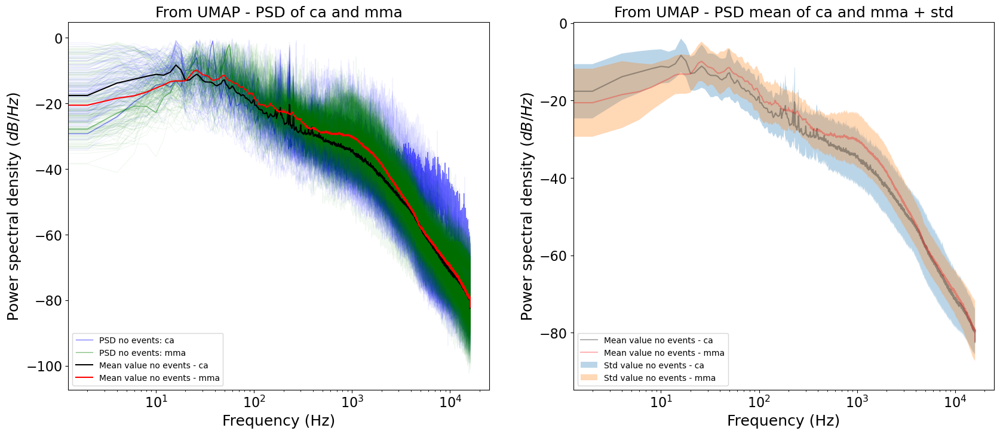

In [284]:
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' 

fig, axes = plt.subplots(1,2, figsize=(20,8))
mean_value_mma = []
mean_value_ca = []

for f in range(len(data_upper['class'])):
    
    if (data_upper['station'].loc[f]=='ronda4/'):
        
        wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
        freq, normalized_psd_dB = welch_periodogram(wav_file)
        mean_value_ca.append(normalized_psd_dB)
        #fig.add_subplot(111)
        axes[0].semilogx(freq, normalized_psd_dB.T, color='b', lw=1, alpha=0.05)
        
        if f == 0:
            axes[0].semilogx(freq, normalized_psd_dB.T, color='b', lw=1, alpha=0.5, label='PSD no events: ca')
        
    if (data_upper['station'].loc[f]=='ronda5/'):
        
        wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
        freq, normalized_psd_dB = welch_periodogram(wav_file)
        
        mean_value_mma.append(normalized_psd_dB)
        #fig.add_subplot(111)
        axes[0].semilogx(freq, normalized_psd_dB.T, color='g', lw=1, alpha=0.05)
        
        if f == 140:
            axes[0].semilogx(freq, normalized_psd_dB.T, color='g', lw=1, alpha=0.5, label='PSD no events: mma')
        

#plt.xlabel('Frequency (Hz)'), plt.ylabel('Power spectral density ($dB/Hz)$')    
mean_value_mma = np.array(mean_value_mma)
mean_value_ca = np.array(mean_value_ca)

std_dev_value_mma = np.std(mean_value_mma, axis = 0)

mean_value_mma = np.mean(mean_value_mma, axis=0)

std_dev_value_ca = np.std(mean_value_ca, axis = 0)

mean_value_ca = np.mean(mean_value_ca, axis=0)


axes[0].semilogx(freq, mean_value_ca.T, 'k', label='Mean value no events - ca')
axes[0].semilogx(freq, mean_value_mma.T, 'r', label='Mean value no events - mma')
#axes[0].xlabel('Frequency (Hz)'), axes[0].ylabel('Power spectral density ($dB/Hz)$')
#
#plt.legend()

axes[1].semilogx(freq, mean_value_ca[0], 'k-', alpha=0.3, label='Mean value no events - ca')
axes[1].semilogx(freq, mean_value_mma[0], 'r-', alpha=0.3, label='Mean value no events - mma')
axes[1].fill_between(freq, mean_value_ca[0]-std_dev_value_ca[0], mean_value_ca[0]+std_dev_value_ca[0], alpha=0.3, label='Std value no events - ca')
axes[1].fill_between(freq, mean_value_mma[0]-std_dev_value_mma[0], mean_value_mma[0]+std_dev_value_mma[0], alpha=0.3, label='Std value no events - mma')
#axes[1].legend()
#axes[1].xlabel('Frequency (Hz)'), plt.ylabel('Power spectral density ($dB/Hz)$')    axes[1]
axes[0].legend(loc='lower left')
axes[1].legend(loc='lower left')
#axes[0].set(xlabel= 'Frequency (Hz)', ylabel='Power spectral density ($dB/Hz)$')
axes[0].set_xlabel( 'Frequency (Hz)', fontsize=18)
axes[1].set_xlabel( 'Frequency (Hz)', fontsize=18)

axes[0].set_ylabel( 'Power spectral density ($dB/Hz)$', fontsize=18)
axes[1].set_ylabel( 'Power spectral density ($dB/Hz)$', fontsize=18)
#axes[1].set(xlabel= 'Frequency (Hz)', ylabel='Power spectral density ($dB/Hz)$')
axes[0].set_title('From UMAP - PSD of ca and mma', fontsize=18)
axes[1].set_title('From UMAP - PSD mean of ca and mma + std', fontsize=18)

for label in (axes[0].get_xticklabels() + axes[0].get_yticklabels()): 
    label.set_fontsize(16)

for label in (axes[1].get_xticklabels() + axes[1].get_yticklabels()): 
    label.set_fontsize(16) 
    

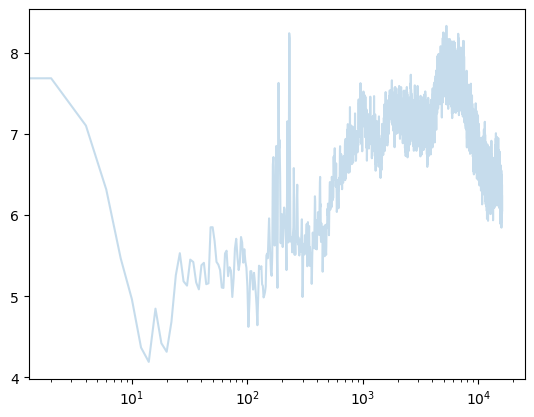

In [231]:
plt.show()
plt.semilogx(freq, std_dev_value.T, alpha=0.25)

In [245]:
len(mean_value_ca)

1

(Text(0.5, 0, 'Frequency (Hz)'),
 Text(0, 0.5, 'Power spectral density ($dB/Hz)$'))

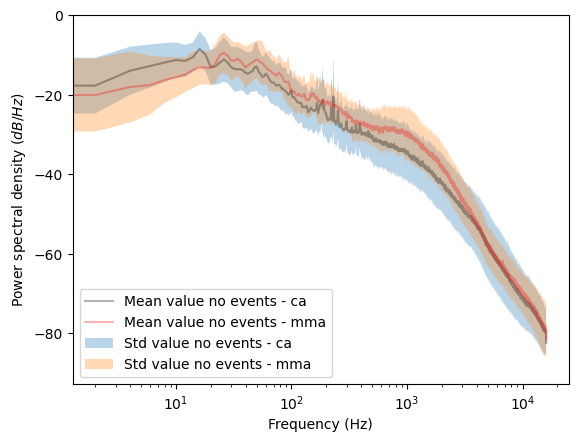

In [257]:
plt.semilogx(freq, mean_value_ca[0], 'k-', alpha=0.3, label='Mean value no events - ca')
plt.semilogx(freq, mean_value_mma[0], 'r-', alpha=0.3, label='Mean value no events - mma')
plt.fill_between(freq, mean_value_ca[0]-std_dev_value_ca[0], mean_value_ca[0]+std_dev_value_ca[0], alpha=0.3, label='Std value no events - ca')
plt.fill_between(freq, mean_value_mma[0]-std_dev_value_mma[0], mean_value_mma[0]+std_dev_value_mma[0], alpha=0.3, label='Std value no events - mma')
plt.legend()
plt.xlabel('Frequency (Hz)'), plt.ylabel('Power spectral density ($dB/Hz)$')    

In [201]:
plt.show()

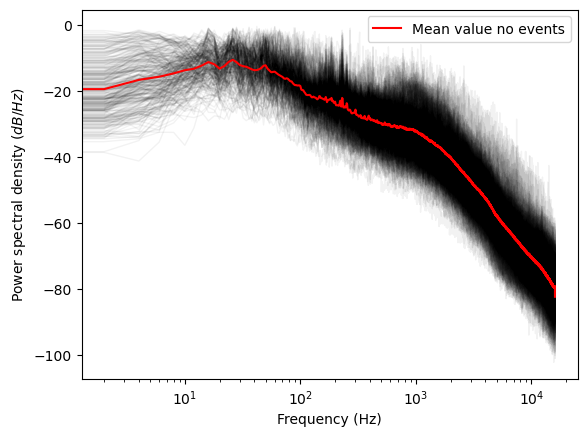

In [234]:
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' 

fig = plt.figure()
mean_value = []
for f in range(len(data_upper['class'])):
    
    #if f<=len(data_upper_r4):
        
    wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
    freq, normalized_psd_dB = welch_periodogram(wav_file)
    mean_value.append(normalized_psd_dB)
    #fig.add_subplot(111)
    plt.semilogx(freq, normalized_psd_dB.T, color='k', lw=1, alpha=0.05)
        
        #if f == 0:
            #plt.semilogx(freq, normalized_psd_dB.T, color='k', lw=1, alpha=0.3, label='PSD no events: mma, ca')
        
    #if (len(data_upper_r4) <f) and (f<=len(data_upper_r5)):
        
        #wav_file = main + data_upper['station'].loc[f] + 'ruido/'+ data_upper.loc[f].iat[3]
        #freq, normalized_psd_dB = welch_periodogram(wav_file)
        #mean_value.append(normalized_psd_dB)
        ##fig.add_subplot(111)
        #plt.semilogx(freq, normalized_psd_dB.T, color='k', lw=1, alpha=0.05)
        

plt.xlabel('Frequency (Hz)'), plt.ylabel('Power spectral density ($dB/Hz)$')    
mean_value = np.array(mean_value)
std_dev_value = np.std(mean_value, axis = 0)

mean_value = np.mean(mean_value, axis=0)



plt.semilogx(freq, mean_value.T, 'r', label='Mean value no events')
plt.legend()

In [ ]:
for a in [1.0, 2.0, 3.0]:
    plt.plot(x, a*x)

plt.show()

In [41]:
result = 0.0008**2
result


6.4e-07

In [ ]:
data_lower = lower.reset_index()
data_lower 

In [ ]:
a = 22
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_lower['station'].loc[a] + 'ruido/'
wav_file = main + data_lower.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

#### Spectral analysys and spectral slope

+ Different acoustic features of components such as spectral slope, bands of frequencies and their temporal properties can be evaluated to detect and reject audio signals.

+ Spectral ratios indicate dominant frequency.

+ Spectral ratios and spectral analysis may be used to distinguish between noise and signal.

+ Event (E)-to-No Event (NE) Component Spectral Ratio

+ The E-to-NE Spectral Power amplitude ratio called $E/NE_{\text{Spectral\_ratio}}$ for two spectral components: event spectra and no-event spectra are calculated. The calculation is shown by the following equation 

$$
\begin{align*}
E/(NE)_{\text{Spectral\_ratio}} &=
\end{align*}
$$

#### Compute the average bandpower of the signals

+ We are going to compute the average power of the signals in a specific frequency range from an auditory  perceptual point of view.

+ To do this, we are going to use both Welch and the multitaper spectral estimation methods. 

+ This computing is mainly generated for gaining insights about the signal processing in the context of the quality of sound event, or, no event chunks.

#### Distinct frequency bands

+ We are most sensitive to sounds in the range of 1,000 – 3,000 Hz.
+ The method to analyze the audio data is based on the decomposition of the signal into functionally distinct frequency bands, such as band1 (600–1500 Hz), band2 (1600–2500 Hz), band3 (2600–3500 Hz).

#### Average band power metric 

+ The average band power consists in computing a single number that summarizes the contribution of the given frequency band to the overall power of the signal.

+ The procedure implies the decomposition of the signal into frequency components using the Fourier transform, that is basically, the Fast Fourier Transform (FFT). It returns, for each frequency bin, a complex number from which one can then easily extract the amplitude and phase of the signal at that specific frequency. 

+ In the spectral analysis, we take the magnitude-squared of the FFT to obtain an estimate of the power spectral density, expressed in (micro)-Volts2 per Hertz in the case of data.

#### Usefulness of the metric average band power

+ The metric is particularly useful because we want to extract some keys features from the data and have a single number that summarizes a particular aspect of the data.

+ The average band power is also a very relevant metric for this research because it allows to differentiate between noise and signal. 

+ For instance, noise is characterized by a steep spectral slope at high frequencies in the PSD curves.

its slope of slow-waves with a frequency range comprised between 0.5 to 4 Hz (i.e. delta band), which reflects a synchronized brain activity. Conversely, wakefulness is characterized by very little delta activity and much more higher-frequencies activity. Therefore, if you were to compute the delta bandpower for both deep sleep and wakefulness, the former would be very high and the latter very low. See for yourself below:

In [ ]:
a = 15
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_miniball['station'].loc[a] + 'ruido/'
wav_file = main + data_miniball.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)
sample_rate

In [ ]:
resample_rate = 32000
resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)

In [ ]:
plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

In [ ]:
plot_waveform(resampled_waveform, resample_rate, title="Resampled Waveform")
plot_specgram(resampled_waveform, resample_rate)
Audio(resampled_waveform.numpy()[0], rate=resample_rate)

#### Compute the average bandpower of a no-event signal

+ We are most sensitive to sounds in the range of 1,000 – 4,000 Hz.
+ The method to analyze the audio data is based on the decomposition of the signal into functionally distinct frequency bands, such as band1 (600–1500 Hz), band2 (1600–2500 Hz), band3 (2600–3500 Hz), and band4 (3600-4500 Hz).
+ Our lowest frequency of interest is 600 Hz so we will choose a window of 2/600 = 4 seconds

In [ ]:
lowest_freq = 600
window_choose = 2/600 #seconds
window_choose

In [ ]:
# Define window length (4 seconds)
win = window_choose * resample_rate #samples
win

freqs, psd = signal.welch(resampled_waveform, resample_rate, nperseg=win)
normalized_psd = psd[0] / np.linalg.norm(psd[0])
normalized_psd_dB = 10*np.log10(normalized_psd)

In [ ]:
plt.figure(figsize=(10,2))
#plt.plot(freqs, psd[0], color='k', lw=2)
plt.loglog(freqs, normalized_psd, color='k', lw=2)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectral density (V^2 / Hz)')
#plt.ylim([0, psd.max() * 1.1])
plt.title("Welch's periodogram")
plt.xlim([0, freqs.max()])
plt.grid(True)
ax=plt.gca()
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))
plt.show(block=False)

In [ ]:
freqs

In [ ]:
psd[0]

In [ ]:
# Define lower and upper limits
low, high   = 500, 1500
low2, high2 = 1500, 2500
low3, high3 = 2500, 3500
low4, high4 = 3500, 4500

# Find intersecting values in frequency vector
idx_band = np.logical_and(freqs >= low, freqs <= high)
idx_band2 = np.logical_and(freqs >= low2, freqs <= high2)
idx_band3 = np.logical_and(freqs >= low3, freqs <= high3)
idx_band4 = np.logical_and(freqs >= low4, freqs <= high4)

# Plot the power spectral density and fill the band area
plt.figure(figsize=(5,4))

#plt.loglog(freqs, normalized_psd, lw=2, color='k')
plt.semilogx(freqs, psd[0], lw=2, color='k')

plt.fill_between(freqs, psd[0], where=idx_band, color='silver')
plt.fill_between(freqs, psd[0], where=idx_band2, color='silver')
plt.fill_between(freqs, psd[0], where=idx_band3, color='silver')
plt.fill_between(freqs, psd[0], where=idx_band4, color='silver')

#plt.fill_between(freqs, normalized_psd, where=idx_band, color='silver')
#plt.fill_between(freqs, normalized_psd, where=idx_band2, color='silver')
#plt.fill_between(freqs, normalized_psd, where=idx_band3, color='silver')
#plt.fill_between(freqs, normalized_psd, where=idx_band4, color='silver')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectral density (uV^2 / Hz)')
#plt.xlim([0, 6000])
#plt.ylim([0, psd.max() * 1.1])
plt.grid(True)
ax=plt.gca()
#ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))
plt.show(block=False)

#### Absolute band power 
+  The absolute band power is equal to the area under the PSD curve and calculated by the integration method

In [ ]:
# Frequency resolution
freq_res = freqs[1] - freqs[0]  
freq_res
# Compute the absolute power by approximating the area under the curve
band_power1 = simps(psd[0][idx_band], dx=freq_res)
print('Absolute power: %.6f uV^2' % band_power1)

#### Again
+ https://notebook.community/JoseGuzman/myIPythonNotebooks/SignalProcessing/Welch's%20periodogram
+ The two normalizations necessary to obtain the amplitudes from the Fourier coefficients are:

> + 1) Divide the Fourier coefficients by the size of the signal 
> + 2) multipy by two to obtain the amplitude of the negative frequencies.

+ Additionally, we can set the DC-component to zero.

In [ ]:
waveform_ex = resampled_waveform.numpy()
waveform_ex[0]

In [ ]:
# Fourier transform
FourierCoeff = np.fft.fft(waveform_ex[0])/waveform_ex[0].size
DC = [np.abs(FourierCoeff[0])]
amp = np.concatenate((DC, 2*np.abs(FourierCoeff[1:])))  

# compute frequencies vector until half the sampling rate
Nsamples = int( math.floor(waveform_ex[0].size/2) )
hz = np.linspace(0, resample_rate/2., num = Nsamples + 1 )
dhz = hz[1]
print('Spectral resolution = %2.4f Hz'%dhz)

In [ ]:
# Perform Welch's periodogram
segment = int( resample_rate*0.5 ) 
myhann = signal.get_window('hann', segment)

# obtain simply Power (amplitude^2) withouth tappering
myparams = dict(fs = resample_rate, nperseg = segment, window = np.ones(segment), 
                noverlap = 0, scaling = 'spectrum', return_onesided=True)
freq, ps = signal.welch(x = waveform_ex[0], **myparams)# units uV**2
ps = 2*ps # correct for negative frequencies

#obtain Power density (amplitude^2/Hz) withouth tappering
myparams = dict(fs = resample_rate, nperseg = segment, window = np.ones(segment), 
                noverlap = 0, scaling = 'density', return_onesided=True)
freq, psd = signal.welch(x = waveform_ex[0], **myparams)# units uV**2/Hz
psd = 2*psd # correct for negative frequencies

dfreq = freq[1]
print('Spectral resolution = %2.4f Hz'%dfreq)

In [ ]:
# Plot the power spectrum

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].set_title("Amplitude spectrum (Fourier transform)")
ax[0].stem(hz,amp[:len(hz)], use_line_collection = True)
ax[0].set_ylabel('Amplitude ($\mu V$)')

ax[1].set_title("Power spectrum (Welch's periodogram)")
ax[1].semilogx(freq, ps, color='k', lw=2) 
ax[1].set_ylabel('Power spectrum ($\mu V^2$)')
ax[1].set_xlabel('Frequency (Hz)')

In [ ]:
# Sine wave has an amplitude of 2 uV, the power is 4 uV and the power density is 4*4 because
# we took a segment with size = 4x the sampling rate
print('Signal amplitude     = %2.9f uVolts'%amp[int(0.0035/dhz)]) 
print('Signal power         = %2.9f uVolts^2'%ps[int(0.0035/dfreq)])
print('Singal power density = %2.9f uVolts^2/Hz'%psd[int(0.0035/dfreq)])

In [ ]:
waveform_ex = resampled_waveform.numpy()
waveform_ex[0]

In [ ]:
# Fourier transform
FourierCoeff = np.fft.fft(waveform_ex[0])/waveform_ex[0].size
DC = [np.abs(FourierCoeff[0])]
amp = np.concatenate((DC, 2*np.abs(FourierCoeff[1:])))  

# compute frequencies vector until half the sampling rate
Nsamples = int( math.floor(waveform_ex[0].size/2) )
hz = np.linspace(0, resample_rate/2., num = Nsamples + 1 )
print('Spectral resolution = %2.4f Hz'%hz[1])

In [ ]:
# Perform Welch's periodogram with hann window and 50% overlap
segment = int( 0.5*resample_rate ) 
myhann = signal.get_window('hann', segment)


# obtain simply Power (uV^2) with Hann window and 50% overlap
myparams = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                noverlap = segment/2, scaling = 'spectrum', return_onesided=True)

freq, ps = signal.welch(x = waveform_ex[0], **myparams)# units uV**2
ps = 2*ps # correct for negative frequencies

# obtain Power density (uV^2/Hz) with Hann window and 50% overlap
# to get back to simply power, divide by the segment lenght in seconds (four in our case)
myparams2 = dict(fs = resample_rate, nperseg = segment, window = myhann, 
                 noverlap = segment/2, scaling = 'density', return_onesided=True)
freq, psd = signal.welch(x = waveform_ex[0], **myparams2)# units uV**2
psd = 2*psd

dfreq = freq[1]
print('Spectral resolution = %2.4f Hz'%dfreq)

In [ ]:
# Plot the power spectrum

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].set_title("Amplitude spectrum (Fourier transform)")
ax[0].stem(hz,amp[:len(hz)], use_line_collection = True)
#ax[0].semilogx(freq, np.sqrt(ps), color='brown', lw = 2)
ax[0].loglog(freq, np.sqrt(ps), color='brown', lw = 2)
ax[0].set_ylabel('Amplitude ($\mu V$)')

ax[1].set_title("Power density (Welch's periodogram)")
#ax[1].semilogx(freq, psd, color='k', lw=2)
ax[1].loglog(freq, psd, color='k', lw=2)

ax[1].set_ylabel('Power spectrum density \n($\mu V^2/Hz$)')



In [ ]:
result = np.where(psd == np.amax(psd))
result
print(freq[result])

In [ ]:
# compute the signal at 1 Hz
print('Signal amplitude @200Hz     = %.15f uVolts'%amp[int(180/dhz)]) 
print('Signal power @200Hz         = %.15f uVolts^2'%ps[int(180/dfreq)])
print('Singal power density @200Hz = %.15f uVolts^2/Hz'%psd[int(180/dfreq)])

In [ ]:
# compute delta-band
idx_delta = np.logical_and(freq >= 600, freq <=1500)
band_power = simps(psd[idx_delta], dx = dfreq)
total_power = simps(psd, dx = dfreq)

print('Absolute power: %.15f uV^2' % delta_power)
print('Relative power: %.15f ' % (band_power/total_power))

In [ ]:
miniball

In [ ]:
miniball.info()

In [ ]:
columnas = miniball.columns
columnas = list(columnas)
columnas

In [ ]:
df2_miniball = miniball[['duration','power', 'Embedding 0', 'Embedding 1']]
print(df2_miniball.columns)

In [ ]:
a = 15
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_miniball['station'].loc[a] + 'ruido/'
wav_file = main + data_miniball.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)

In [ ]:
import seaborn as sns
# a for loop to automate our task--------------
for i in df2_miniball.columns:
    plt.figure()
    plt.tight_layout()
    sns.set(rc={"figure.figsize":(8, 5)})
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True)
    plt.gca().set(xlabel= i,ylabel='Frequency')
    sns.boxplot(df2_miniball[i], ax=ax_box , linewidth= 1.0)
    sns.histplot(df2_miniball[i], ax=ax_hist , bins = 80,kde=True)

In [ ]:
a = 15
main = '/home/kasparov/Documentos/20190114_vpoblete/20221027_joaquin/fusa_power/' + data_miniball['station'].loc[a] + 'ruido/'
wav_file = main + data_miniball.loc[a].iat[3]
waveform, sample_rate = torchaudio.load(wav_file)

plot_waveform(waveform, sample_rate, title="Waveform")
plot_specgram(waveform, sample_rate)
Audio(waveform.numpy()[0], rate=sample_rate)